# imports

In [ ]:
import cv2                                      # for image operations
import matplotlib.pyplot as plt                 # for visualisation
import numpy as np                              # for numerical operations
from google.colab.patches import cv2_imshow     # for displaying images on colab
from tqdm import tqdm
import random

# helper

In [ ]:
def plot_side_by_side(img_1, img_2, title1="Original Image", title2="Processed Image"):
    """
    A function to plot two images side by side.
    """
    if len(img_1.shape) == 3 or len(img_2.shape) == 3:
        img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
        img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(img_1, cmap='gray')
    axs[1].imshow(img_2, cmap='gray')

    axs[0].set_title(title1)
    axs[1].set_title(title2)

# get the images

In [ ]:
import gdown

images = {
    "https://drive.google.com/file/d/1VRWi_ApOvUhwzZUGEHFEhXM5_mttKdI4/view?usp=sharing": "buzz.jpg",
    "https://drive.google.com/file/d/1qqbkYHPmbC5HcCoa8_0qmVvsZDvVkuff/view?usp=sharing": "corridor.jpg",
    "https://drive.google.com/file/d/1Z9Oa4kPAzZua19tH1S1Fw_9i-fqJMbQy/view?usp=sharing": "uttower_right.JPG",
    "https://drive.google.com/file/d/16CWahFsgaXUjeFx2KjM3niyym7VR1-Ry/view?usp=sharing": "uttower_left.JPG"
}

for url, file_name in images.items():

    gdown.download(url, file_name, quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=1VRWi_ApOvUhwzZUGEHFEhXM5_mttKdI4
To: /content/buzz.jpg
100%|██████████| 137k/137k [00:00<00:00, 5.20MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qqbkYHPmbC5HcCoa8_0qmVvsZDvVkuff
To: /content/corridor.jpg
100%|██████████| 889k/889k [00:00<00:00, 10.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Z9Oa4kPAzZua19tH1S1Fw_9i-fqJMbQy
To: /content/uttower_right.JPG
100%|██████████| 190k/190k [00:00<00:00, 6.06MB/s]
Downloading...
From: https://drive.google.com/uc?id=16CWahFsgaXUjeFx2KjM3niyym7VR1-Ry
To: /content/uttower_left.JPG
100%|██████████| 191k/191k [00:00<00:00, 5.57MB/s]


# Image transformations - Warping

## 2D Planar Transformations

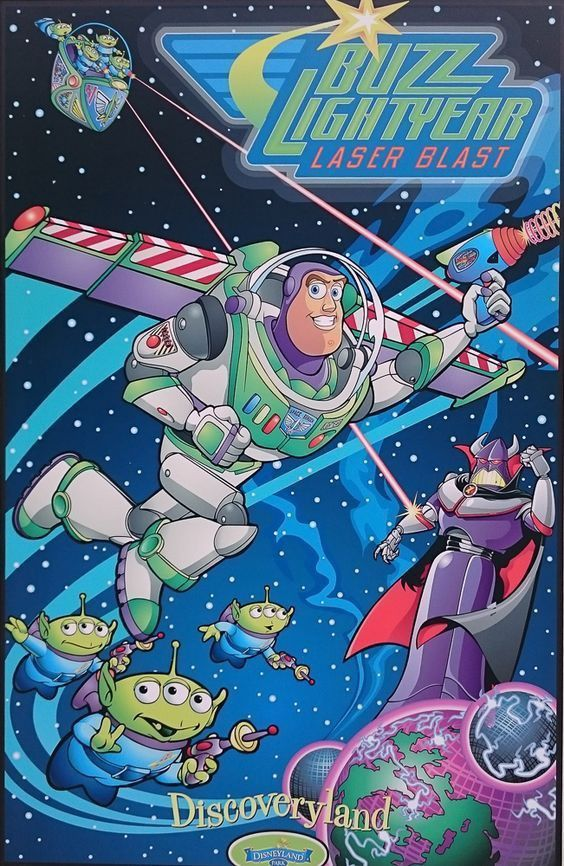

In [ ]:
buzz = cv2.imread("buzz.jpg")

h, w, _ = buzz.shape

cv2_imshow(buzz)

### Affine


In [ ]:
affine_matrix = np.array([[1, 0, 50], [0, 1, 20]], dtype=np.float32)

# The first row [1, 0, 50] represents the horizontal transformation:
#     * 1 indicates no change in the x-coordinates of points.
#     * 0 indicates no skew or shear in the x-direction.
#     * 50 represents a translation by 50 units along the x-axis.

# The second row [0, 1, 20] represents the vertical transformation:
#     * 0 indicates no skew or shear in the y-direction.
#     * 1 indicates no change in the y-coordinates of points.
#     * 20 represents a translation by 20 units along the y-axis.

# So, this affine transformation matrix translates all points in the x-direction by 50 units and in the y-direction by 20 units.

#### OpenCV Implementation

```
cv2.warpAffine(src, M, dsize)
```

* `src`: input image
* `M`: transformation matrix
* `dsize`: size of the output image *(width, height)*

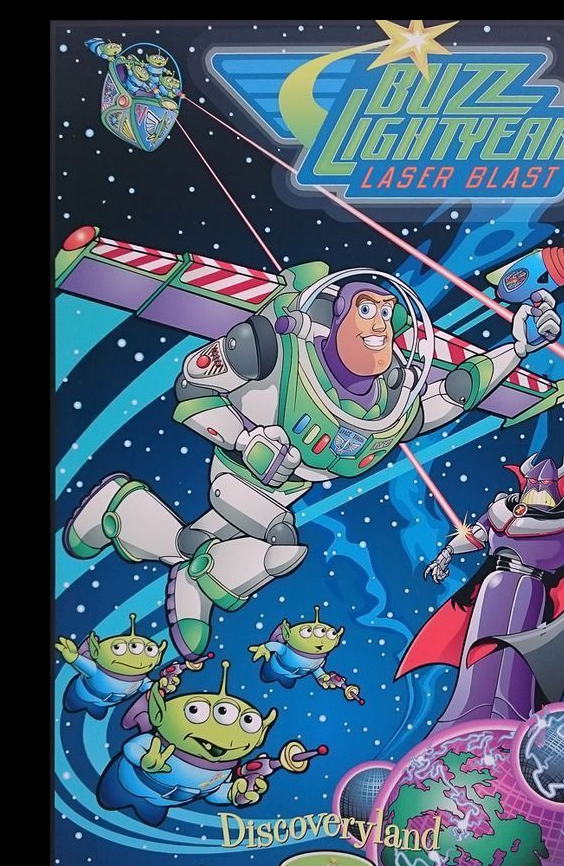

In [ ]:
affine_cv = cv2.warpAffine(buzz, affine_matrix, (w, h))
cv2_imshow(affine_cv)

#### ***Exercise 1.1 -*** Affine transformation from scratch

In [ ]:
def affine_transform(image, matrix):
    h, w = image.shape[:2]                          # Get height and width of the input image
    output = np.zeros_like(image)                   # Create an output image with the same dimensions as the input, initialized with zeros

    for y in range(h):                              # Iterate over each row (y-coordinate) in the input image
        for x in range(w):                          # Iterate over each column (x-coordinate) in the input image
            src_point = np.array([x, y, 1])         # Define the source point as a homogeneous coordinate [x, y, 1]
            dst_point = np.dot(matrix, src_point)   # Apply the affine transformation matrix to the source point
            dst_x, dst_y = dst_point.astype(int)    # Convert the transformed point to integer coordinates

            if 0 <= dst_x < w and 0 <= dst_y < h:   # Check if the transformed point is within the bounds of the output image
                output[dst_y, dst_x] = image[y, x]  # Assign the pixel value from the input image to the corresponding position in the output image
    return output                                   # Return the transformed image

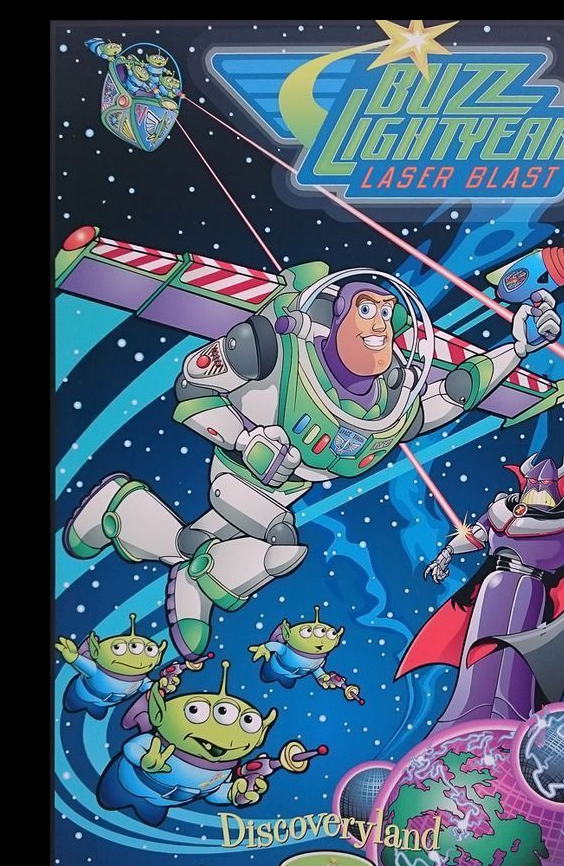

In [ ]:
affine_scratch = affine_transform(buzz, affine_matrix)
cv2_imshow(affine_scratch)

### Perspective



In [ ]:
perspective_matrix = np.array([[1, 0.5, 50], [0.2, 1, 20], [0.001, 0.002, 1]], dtype=np.float32)

# The first row [1, 0.5, 50] represents how much each coordinate (x, y, z) of a point will be scaled and translated when projected onto the 2D plane.
#     The first element 1 means that the x-coordinate remains unchanged.
#     The second element 0.5 means that the y-coordinate is halved.
#     The third element 50 represents a translation in the x-direction.

# The second row [0.2, 1, 20] represents similar transformations for the y-coordinate.
#     The first element 0.2 means that the x-coordinate is scaled by 0.2.
#     The second element 1 means that the y-coordinate remains unchanged.
#     The third element 20 represents a translation in the y-direction.

# The third row [0.001, 0.002, 1] represents similar transformations for the z-coordinate. However, these values are very small, indicating that the z-coordinate is not significantly scaled or translated.

# Together, this matrix defines a perspective transformation that scales and translates points in 3D space before projecting them onto a 2D plane. The specific scaling and translation factors determine the properties of the perspective projection.

#### OpenCV Implementation

```
cv2.warpPerspective(buzz, perspective_matrix, (w, h))
```

* `src`: input image
* `M`: transformation matrix
* `dsize`: size of the output image *(width, height)*

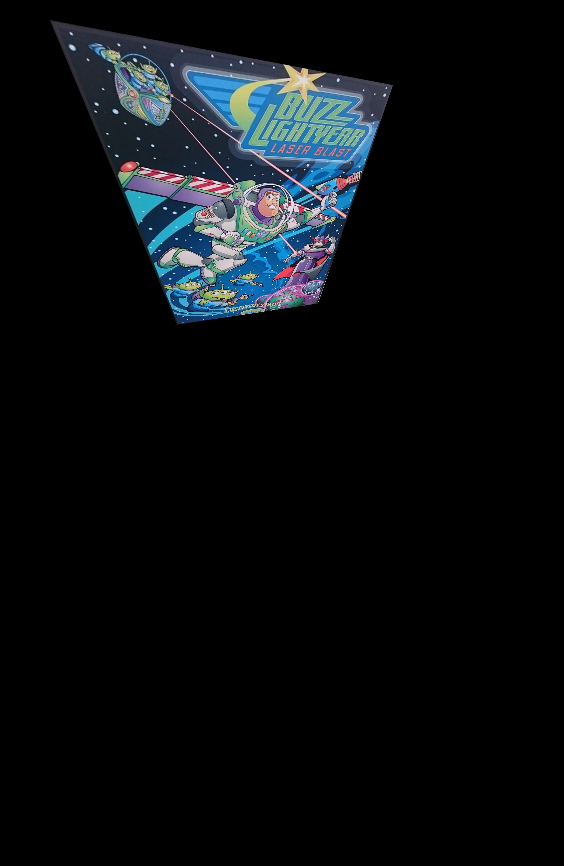

In [ ]:
perspective_cv = cv2.warpPerspective(buzz, perspective_matrix, (w, h))
cv2_imshow(perspective_cv)

#### ***Exercise 1.2*** - Perspective transformation from scratch

When performing geometric transformations or resizing images, it's common to encounter non-integer coordinates, especially when scaling or rotating the image. In such cases, interpolation techniques, like bilinear interpolation, are used to estimate pixel values at these non-integer coordinates based on the values of neighboring pixels.

>**P.S.** To get the exact same output with OpenCV implementation, you need to use bilinear interpolation for the estimation of pixel values at the non-integer coordinates. Here is the formula:
>
>
>Let's say we want to estimate the value $V$ at a point $(x,y)$ within the grid formed by four neighboring points with known values $V_{00}$, $V_{01}$, $V_{10}$ and $V_{11}$. Here's the mathematical formulation for bilinear interpolation:
>
>
>$V = (1-d_x)(1-d_y).V_{00} + d_x(1-d_y).V_{10} + (1-d_x)d_y.V_{01} + d_x.d_y.V_{11}$



* Perspective transformations introduce distortions such as foreshortening and depth, which cannot be represented solely by a direct mapping from input to output coordinates.
* Unlike affine transformations, perspective transformations do not preserve parallel lines or ratios of distances along them.
* Due to these distortions, it's not straightforward to directly map points from the input image to the output image using a single transformation matrix.

In [ ]:
def perspective_transform(image, matrix):
    h, w = image.shape[:2]  # Get height and width of the input image
    output = np.zeros_like(image)  # Create an output image with the same dimensions as the input, initialized with zeros

    # Iterate over each pixel in the output image
    for dst_y in range(h):
        for dst_x in range(w):
            src_point = np.array([dst_x, dst_y, 1])  # Define the destination point as a homogeneous coordinate [dst_x, dst_y, 1]

            # Apply the inverse perspective transformation matrix to the destination point
            # the inverse of the transformation matrix is used to map points from the output image back to the input image
            # This is because perspective transformations involve a non-linear mapping that cannot be directly represented by a single transformation matrix from input to output.
            src_x, src_y, src_z = np.dot(np.linalg.inv(matrix), src_point)

            # Perform perspective division to obtain the source coordinates
            src_x, src_y = int(src_x / src_z), int(src_y / src_z)
            # to convert the coordinates from homogeneous coordinates to Cartesian coordinates

            # Check if the source coordinates are within the bounds of the input image
            if 0 <= src_x < w - 1 and 0 <= src_y < h - 1:
                dx, dy = src_x - int(src_x), src_y - int(src_y)  # Compute fractional parts for bilinear interpolation
                # how much p[1] deviates from its integer part

                # Perform bilinear interpolation to estimate the pixel value at the non-integer coordinates
                # Bilinear interpolation is a method for interpolating values using the weighted average of the four nearest pixels surrounding the non-integer coordinates.
                output[dst_y, dst_x] = (1 - dx) * (1 - dy) * image[int(src_y), int(src_x)] + \
                                       dx * (1 - dy) * image[int(src_y), int(src_x) + 1] + \
                                       (1 - dx) * dy * image[int(src_y) + 1, int(src_x)] + \
                                       dx * dy * image[int(src_y) + 1, int(src_x) + 1]
    return output  # Return the transformed image

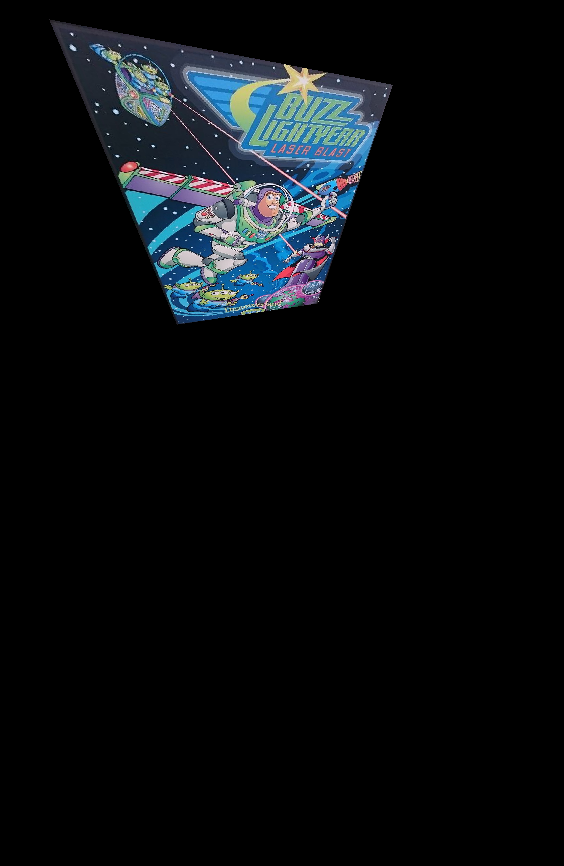

In [ ]:
perspective_scratch = perspective_transform(buzz, perspective_matrix)
cv2_imshow(perspective_scratch)

### Rotate

$M = \begin{bmatrix} cosθ & -sinθ \\ sinθ & cosθ \end{bmatrix}$

$\begin{bmatrix} x^{'}  \\ y^{'} \end{bmatrix} = M \begin{bmatrix} x  \\ y \end{bmatrix}$


In [ ]:
ANGLE = 75

#### OpenCV Implementation

```
cv2.getRotationMatrix2D(center, angle, scale)
```

* `center`: Center of rotation
* `angle`: Angle of Rotation. Angle is positive for anti-clockwise and negative for clockwise.
* `scale`: Scaling factor which scales the image

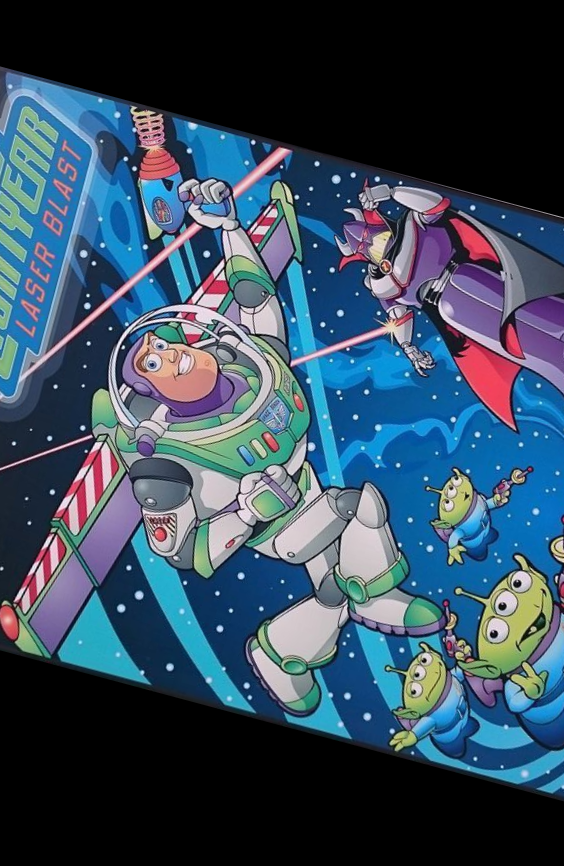

In [ ]:
rotation_matrix = cv2.getRotationMatrix2D((w / 2, h / 2), ANGLE, 1)
rotated_buzz = cv2.warpAffine(buzz, rotation_matrix, (w, h))

cv2_imshow(rotated_buzz)

#### ***Exercise 1.3*** - Rotation from scratch

In [ ]:
def rotate_image(image, angle):
    # Load the image
    height, width = image.shape[:2]

    # Convert angle to radians
    angle_rad = np.deg2rad(angle)

    # Calculate rotation matrix
    cos_theta = np.cos(angle_rad)
    sin_theta = np.sin(angle_rad)

    rotation_matrix = np.array([[cos_theta, -sin_theta],
                                [sin_theta, cos_theta]])

    # Create a new blank image with the calculated dimensions
    rotated_image = np.zeros((height, width, 3), dtype=np.uint8)

    # Calculate rotation center
    center_x = width // 2
    center_y = height // 2

    # Perform rotation
    for y in range(height):
        for x in range(width):
            # Calculate original image coordinates
            x_rot = x - width // 2
            y_rot = y - height // 2

            # Apply rotation matrix
            x_orig = int(x_rot * rotation_matrix[0, 0] + y_rot * rotation_matrix[0, 1]) + center_x
            y_orig = int(x_rot * rotation_matrix[1, 0] + y_rot * rotation_matrix[1, 1]) + center_y

            # Check if the new coordinates are within the original image bounds
            if 0 <= x_orig < width and 0 <= y_orig < height:
                # Copy pixel values from original image to rotated image
                rotated_image[y, x] = image[y_orig, x_orig]

    return rotated_image

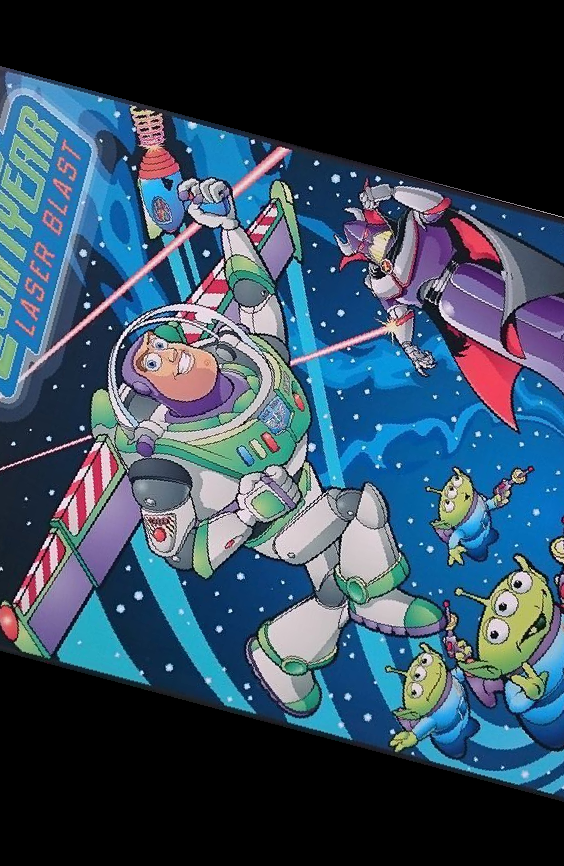

In [ ]:
rotated_buzz_scratch = rotate_image(buzz, 75)

cv2_imshow(rotated_buzz_scratch)

#### ***Exercise 1.4*** - Try to mirror the given image using `cv2.getAffineTransform` to find the transformation matrix.


```
cv2.getAffineTransform(src, dst)
```

* `src`: A numpy array of shape (3, 2) representing three points from the original image. These points are usually chosen to define a triangle in the original image.
* `dst`: A numpy array of shape (3, 2) representing the corresponding points in the transformed image. These points should match the points in src in terms of their order and correspondence.


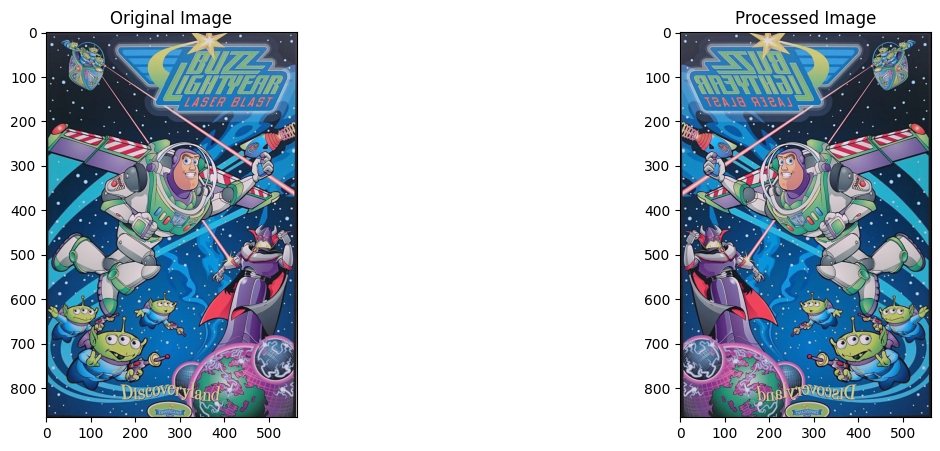

In [ ]:
height, width = buzz.shape[:2]

# Define the 3 pairs of corresponding points
input_pts = np.float32([[0,0], [width-1,0], [0,height-1]])
output_pts = np.float32([[width-1,0], [0,0], [width-1,height-1]])

# Calculate the transformation matrix using cv2.getAffineTransform()
M= cv2.getAffineTransform(input_pts , output_pts)

# Apply the affine transformation using cv2.warpAffine()
dst = cv2.warpAffine(buzz, M, (width,height))

plot_side_by_side(buzz, dst)

## Projective Geometry

In [ ]:
scale_x = 1.2  # Scale in x
shear_y = 0.1  # Shear in y
scale_y = 0.8  # Scale in y
shear_x = 0.2  # Shear in x
translate_x = 20  # Translation along x
translate_y = 10  # Translation along y

### ***Exercise 1.5*** - Apply affine transform to an image.

In [ ]:
def affine_transform(image, scale_x, shear_y, scale_y, shear_x, translate_x, translate_y):
    """
    Applies an affine transformation to an image.

    Args:
        image: A numpy array representing the image (shape: height x width x channels).
        scale_x: Scaling factor in the x direction.
        shear_y: Shear factor in the y direction.
        scale_y: Scaling factor in the y direction.
        shear_x: Shear factor in the x direction.
        translate_x: Translation along the x axis.
        translate_y: Translation along the y axis.

    Returns:
        A new numpy array representing the transformed image.
    """
    # Get image dimensions
    height, width, channels = image.shape

    # Define the output image
    transformed_image = np.zeros_like(image)

    # Loop through each pixel in the original image
    for y in range(height):
        for x in range(width):
            # Apply the transformation to get new coordinates
            new_x = int(scale_x * x + shear_y * y + translate_x)
            new_y = int(shear_x * x + scale_y * y + translate_y)

            # Handle edge cases (outside image boundaries) using nearest neighbor interpolation
            if 0 <= new_x < width and 0 <= new_y < height:
                transformed_image[new_y, new_x] = image[y, x]

    return transformed_image


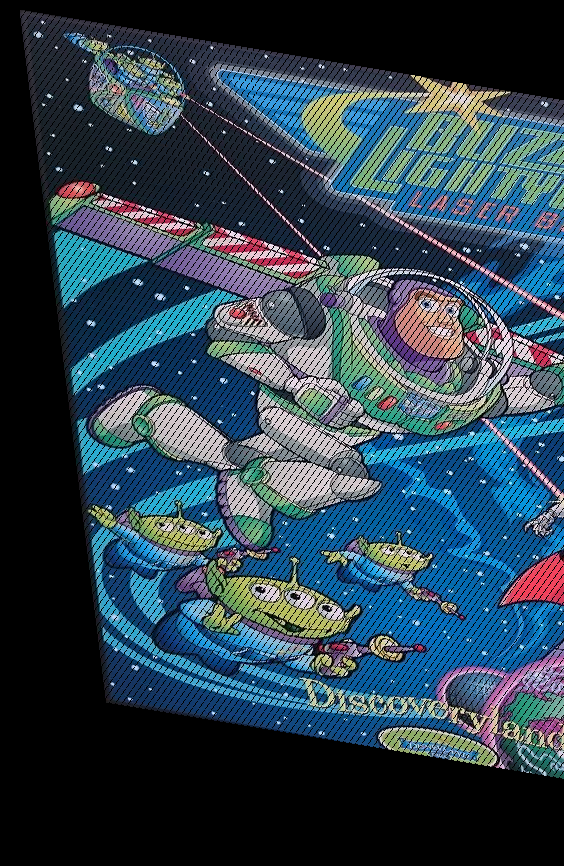

In [ ]:
# Apply the transformation
transformed_image = affine_transform(buzz.copy(), scale_x, shear_y, scale_y, shear_x, translate_x, translate_y)

cv2_imshow(transformed_image)

### OpenCV Implementation


In [ ]:
def affine_transform_opencv(image, scale_x, shear_y, scale_y, shear_x, translate_x, translate_y):
    """
    Applies an affine transformation to an image using OpenCV.

    Args:
        image: A NumPy array representing the image (BGR format).
        scale_x: Scaling factor in the x direction.
        shear_y: Shear factor in the y direction.
        scale_y: Scaling factor in the y direction.
        shear_x: Shear factor in the x direction.
        translate_x: Translation along the x axis.
        translate_y: Translation along the y axis.

    Returns:
        A NumPy array representing the transformed image.
    """
    # Define the source and destination points based on transformation parameters
    # source_points = np.float32([[0, 0], [image.shape[1], 0], [image.shape[1], image.shape[0]], [0, image.shape[0]]])

    # dest_points = np.float32([
    #     [translate_x, translate_y],  # top left
    #     [translate_x + image.shape[1] * scale_x, translate_y + image.shape[0] * shear_y],  # top right
    #     [translate_x + image.shape[1] * scale_x + image.shape[1] * shear_x, translate_y + image.shape[0] * scale_y],  # bottom right
    #     [translate_x + image.shape[1] * shear_x, translate_y + image.shape[0] * scale_y * shear_y]  # bottom left
    # ])

    # # Get the affine transformation matrix
    # transformation_matrix = cv2.getAffineTransform(source_points, dest_points)

    transformation_matrix = np.array([
        [scale_x, shear_y, translate_x],
        [shear_x, scale_y, translate_y]
        # [0, 0, 1]
    ])

    # Apply the transformation to the image
    transformed_image = cv2.warpAffine(image, transformation_matrix, (image.shape[1], image.shape[0]))

    return transformed_image


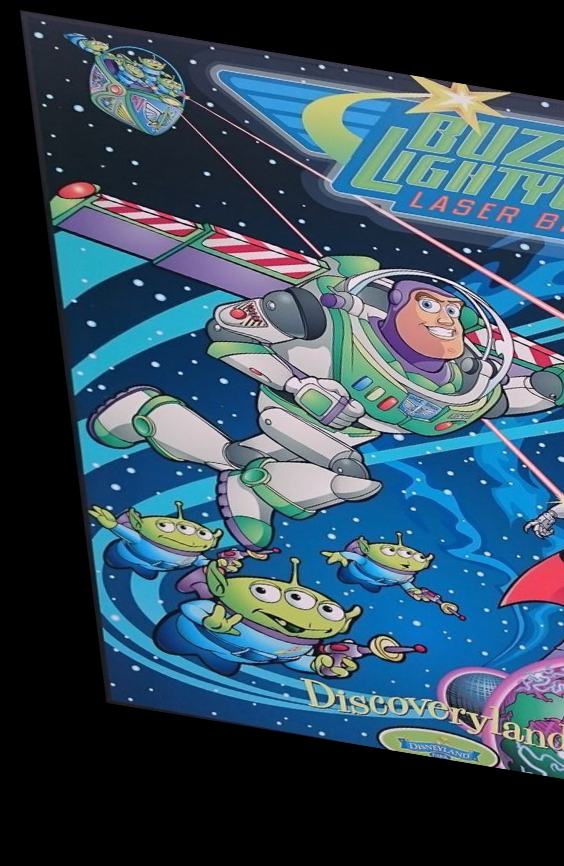

In [ ]:
transformed_image = affine_transform_opencv(buzz.copy(), scale_x, shear_y, scale_y, shear_x, translate_x, translate_y)

cv2_imshow(transformed_image)

### Affine transform playground

Reference: http://16385.courses.cs.cmu.edu/fall2020/notebooks

interactive(children=(FloatSlider(value=1.0, description='a1', max=1.0, min=-1.0), FloatSlider(value=0.0, desc…

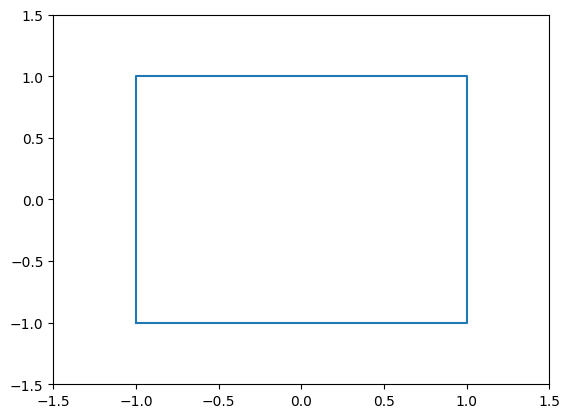

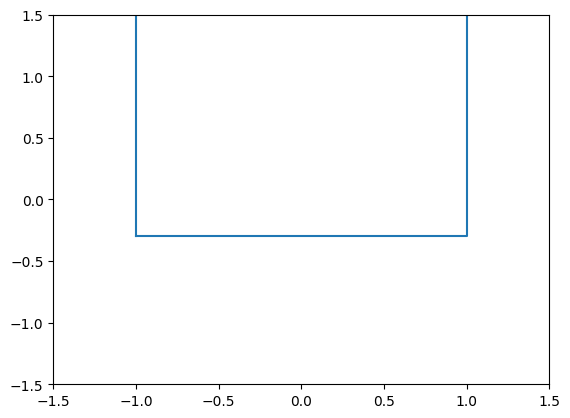

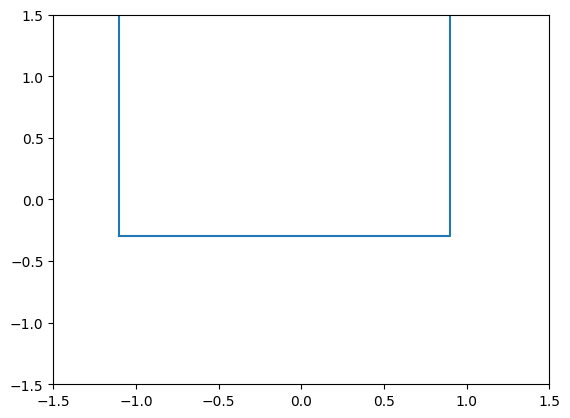

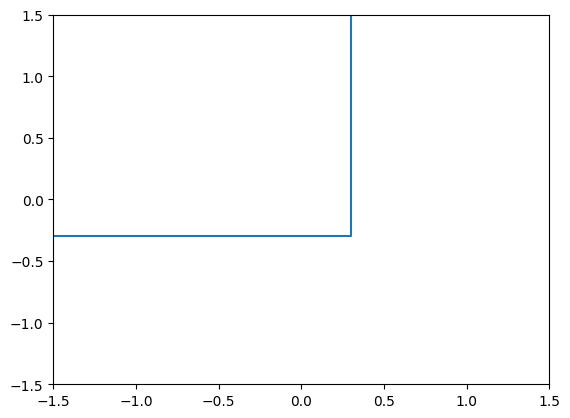

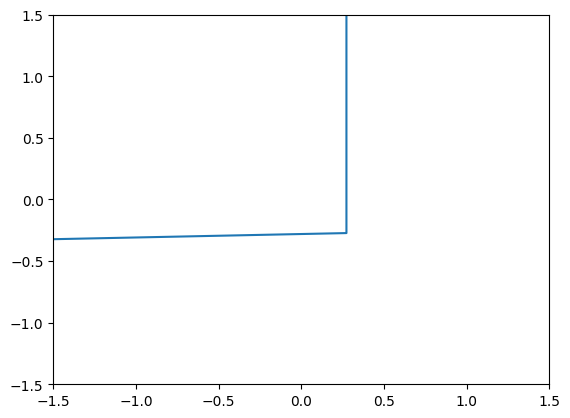

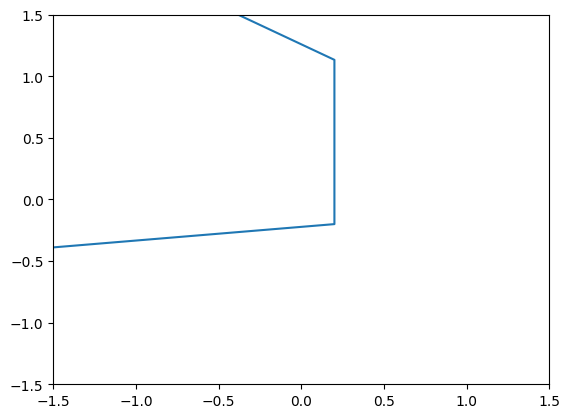

In [ ]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

# Define a box
pts = np.array([[-1, -1,  1,  1, -1], \
                [-1,  1,  1, -1, -1], \
                [ 1,  1,  1,  1,  1]])

def h(a1 = 1.0, a2 = 0.0, a3 = 0.0, a4 = 0.0, \
      a5 = 1.0, a6 = 0.0, a7 = 0.0, a8 = 0.0):
    # Define transformation matrix
    mtx = np.array([[a1, a2, a3], [a4, a5, a6], [a7, a8, 1.0]])

    # Transform points
    transformed_pts = np.matmul(mtx, pts)

    # Divide by homogeneous coordinate
    transformed_pts[0,:] = transformed_pts[0,:] / transformed_pts[2,:]
    transformed_pts[1,:] = transformed_pts[1,:] / transformed_pts[2,:]

    plt.plot(transformed_pts[0,:], transformed_pts[1,:])
    plt.axis([-1.5, 1.5, -1.5, 1.5])
    print('Affine transformation matrix:')
    print(mtx)

interact(h, a1=(-1.0, 1.0), a2=(-1.0, 1.0), a3=(-1.0, 1.0), a4=(-1.0, 1.0), \
            a5=(-1.0, 1.0), a6=(-1.0, 1.0), a7=(-1.0, 1.0), a8=(-1.0, 1.0));

# Image Homographies

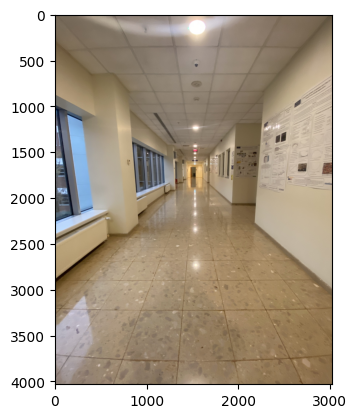

In [ ]:
corridor = cv2.imread("corridor.jpg")
height, width, _ = corridor.shape

plt.imshow(cv2.cvtColor(corridor, cv2.COLOR_BGR2RGB))

### ***Exercise 2.1*** - Apply a projective transformation to the given image (a corridor of FENS), so as to produce the side view (from the wall towards the inner garden); similarly to the below figure.


![image](https://github.com/d2l-ai/d2l-en/assets/52993055/013312aa-fba9-4e83-a7e2-f7cc1b2a51b4)


### ***Exercise 2.1.1*** - OpenCV Implementation

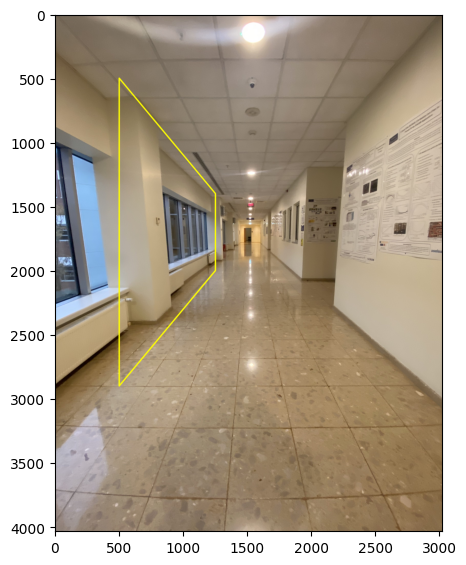

In [ ]:
pts = np.array([[500, 2900],
                [500, 500],
                [1250, 1400],
                [1250, 2000]],
                 np.int32)

pts = pts.reshape((-1,1,2))
image_patch = corridor.copy()

image_patch = cv2.polylines(image_patch, [pts], True, (0,255,255), 9)
image_patch_rgb = cv2.cvtColor(image_patch, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 10))
plt.imshow(image_patch_rgb)

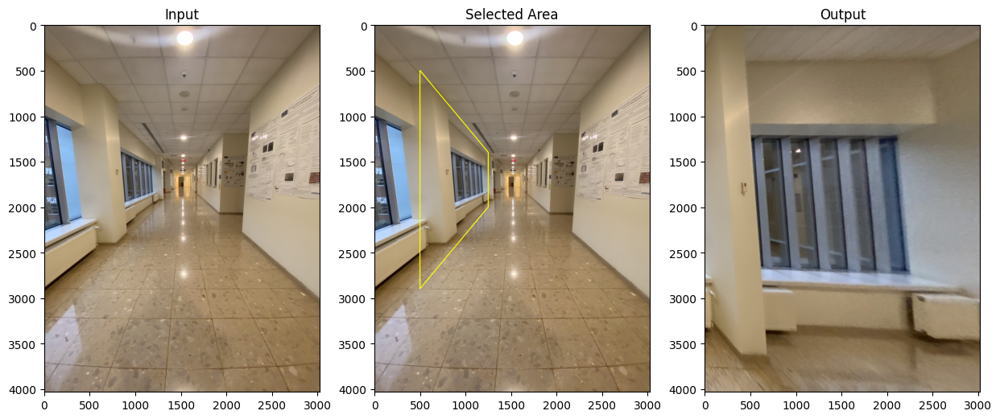

In [ ]:
# define four points on input image
pts1 = np.float32([[500, 2900],
                  [500, 500],
                  [1250, 1400],
                  [1250, 2000]])

# define the corresponding four points on output image
pts2 = np.float32([[0, 4000],
                   [0, 0],
                   [3000, 0],
                   [3000, 4000]])

M, _ = cv2.findHomography(pts1, pts2) # calculate homography

# transform the image using perspective transform matrix
dst = cv2.warpPerspective(corridor, M, (width, height))

plt.figure(figsize=(15, 45))

plt.subplot(131)
image_rgb = cv2.cvtColor(corridor, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.title('Input')

plt.subplot(132)
plt.imshow(image_patch_rgb)
plt.title('Selected Area')

plt.subplot(133)
dst_rgb = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
plt.imshow(dst_rgb)
plt.title('Output')

plt.show()

### ***Exercise 2.1.2*** - from scratch

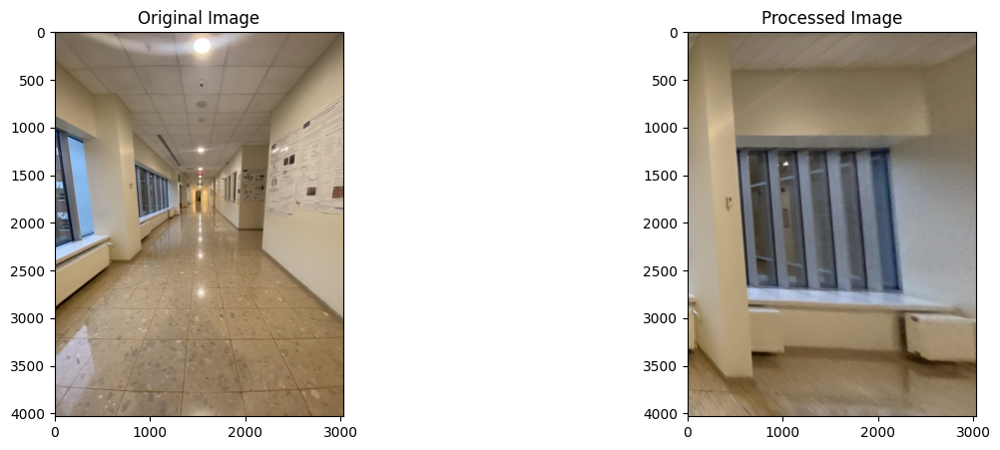

In [ ]:
def compute_perspective_transform(pts1, pts2):
    A = []
    for i in range(4):
        x, y = pts1[i] # coordinates of the source point
        u, v = pts2[i] # coordinates of the destination point
        A.append([x, y, 1, 0, 0, 0, -u*x, -u*y, -u]) # u = (H_11*x + H_12*y + H_13) / (H_31*x + H_32*y + H_33)
        A.append([0, 0, 0, x, y, 1, -v*x, -v*y, -v]) # v = (H_21*x + H_22*y + H_23) / (H_31*x + H_32*y + H_33)

    A = np.array(A)
    U, S, Vt = np.linalg.svd(A) # perform Singular Value Decomposition of A
    H = Vt[-1].reshape(3, 3) # extract the last row of Vt and reshape it to a 3x3 matrix to obtain the transformation matrix H
    H /= H[2, 2] # normalize H by dividing by its last element to ensure it remains a valid homography matrix
    return H

def apply_perspective_transform(image, H):
    H_inv = np.linalg.inv(H) # compute the inverse of the transformation matrix H

    h, w, c = image.shape

    output_image = np.zeros((h, w, c), dtype=image.dtype)

    for y in range(h):
        for x in range(w):
            p = np.dot(H_inv, [x, y, 1]) # applies the inverse transformation H_inv to find the corresponding position (p[0], p[1]) in the input image
            p /= p[2]

            # Bilinear interpolation is performed to compute the pixel value at position (p[0], p[1]) in the input image.
            # It calculates the weighted average of the four nearest pixels to (p[0], p[1]).
            if 0 <= p[0] < w and 0 <= p[1] < h:
                x0, y0 = int(p[0]), int(p[1])
                x1, y1 = min(x0 + 1, w - 1), min(y0 + 1, h - 1)
                dx, dy = p[0] - x0, p[1] - y0
                output_image[y, x] = (1 - dy) * ((1 - dx) * image[y0, x0] + dx * image[y0, x1]) + dy * ((1 - dx) * image[y1, x0] + dx * image[y1, x1])

    return output_image.astype(np.uint8)

# Define the points for the transformation
pts1 = np.float32([[500, 2900],
                   [500, 500],
                   [1250, 1400],
                   [1250, 2000]])

pts2 = np.float32([[0, 4000],
                   [0, 0],
                   [3000, 0],
                   [3000, 4000]])

# Load the input image
input_image = cv2.imread('corridor.jpg')  # Replace 'input_image.jpg' with the path to your image

# Compute the perspective transformation matrix
H = compute_perspective_transform(pts1, pts2)

# Apply the perspective transformation
output_image = apply_perspective_transform(input_image, H)

plot_side_by_side(corridor, output_image)

## Image Stitching

### ***Exercise 2.2*** - Write a script that stitches together two given images, 'uttower_right.JPG' and 'uttower_left.JPG', to create a panoramic view.

(*using the Scale-Invariant Feature Transform (SIFT) algorithm and RANdom SAmple Consensus (RANSAC) for homography estimation*)

>Utilize the following steps:
>
>* Use the SIFT algorithm to detect keypoints and compute descriptors for each image.
>* Implement the Brute-Force Matcher (BFMatcher) algorithm to find keypoint matches between the images.
>* Apply a ratio test to filter ambiguous matches.
>* Employ RANSAC to estimate the homography matrix for aligning the images.

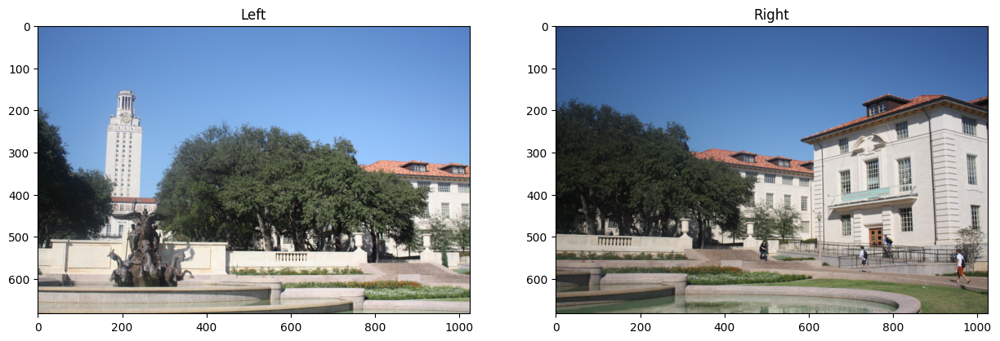

In [ ]:
# Read the first image and convert it to grayscale
img_right = cv2.imread('uttower_right.JPG')

# Read the second image and convert it to grayscale
img_left = cv2.imread('uttower_left.JPG')

plot_side_by_side(img_left, img_right, "Left", "Right")

[[ 7.65715731e-01  3.72082576e-02  4.46807943e+02]
 [-1.35565541e-01  9.12377363e-01  7.60569810e+01]
 [-2.10834981e-04 -3.20176687e-05  1.00000000e+00]]


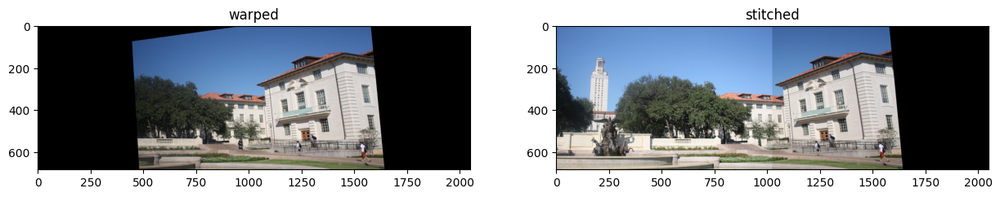

In [ ]:
# Create a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# Detect keypoints and compute descriptors for the first image
kp1, des1 = sift.detectAndCompute(img_right, None)

# Detect keypoints and compute descriptors for the second image
kp2, des2 = sift.detectAndCompute(img_left, None)

# Create a Brute-Force Matcher object
bf = cv2.BFMatcher()

# Find k-nearest neighbors for each descriptor in both images
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test to filter out ambiguous matches
#  Only matches where the distance to the closest match is
# If this condition is met, it implies that the best match is significantly better than the second-best match, indicating a strong match.
# m[0].distance refers to the distance between the descriptor of the current keypoint in the first image and its best match in the second image.
# m[1].distance refers to the distance between the descriptor of the current keypoint in the first image and its second-best match in the second image.
good = []
for m in matches:
    if m[0].distance < 0.5 * m[1].distance:
        good.append(m)
matches = np.asarray(good)

# Check if enough good matches are found
if len(matches[:,0]) >= 4: # we need 4
    # Extract keypoints from good matches
    src = np.float32([kp1[m.queryIdx].pt for m in matches[:,0]]).reshape(-1, 1, 2)
    dst = np.float32([kp2[m.trainIdx].pt for m in matches[:,0]]).reshape(-1, 1, 2)

    # matches[:, 0] -> first match from each match tuple in the matches list
    # trainIdx -> We are interested in using the indices of keypoints from the second image (img_left), hence m.trainIdx is used
    # kp2[m.trainIdx].pt -> this retrieves the coordinates of the keypoint in the second image

    # Estimate the homography matrix using RANSAC algorithm
    H, masked = cv2.findHomography(src, dst, cv2.RANSAC, 5.0)
    print(H)

    # Warp the first image using the estimated homography
    warped = cv2.warpPerspective(img_right, H, (img_left.shape[1] + img_right.shape[1], img_left.shape[0]))

    # Overlay the warped image onto the second image
    stitched = warped.copy()
    stitched[0:img_left.shape[0], 0:img_left.shape[1]] = img_left

    plot_side_by_side(warped, stitched, "warped", "stitched")

else:
    print("There aren't enough matches to perform stitching.")